## Part 1: Data Preprocessing

This notebook processes both the Palisades and Eaton fires from the January 2025 Los Angeles wildfire event. All raster layers, feature tensors, and DINS-only ground truth labels are constructed, visualized, and saved to `eaton_test_files/model/` for downstream modeling.

### Environment Setup

In [1]:
# COLAB DRIVE MOUNT
# Uncomment if running in Google Colab.
#from google.colab import drive
#drive.mount("/content/drive")
#import os
#os.chdir("/content/drive/MyDrive/Colab Notebooks/wui_fires")

In [2]:
#!pip install odc-stac contextily rioxarray planetary-computer pystac-client tensorflow

In [ ]:
# CORE LIBRARIES
import json
import warnings
import geopandas as gpd
import numpy as np
import odc.stac
import contextily as ctx
import matplotlib.pyplot as plt
import rioxarray
from pathlib import Path
from pyproj import Transformer
from IPython.display import display
from rasterio.errors import NotGeoreferencedWarning

# STAC AND ODC MODULES
import planetary_computer
from pystac_client import Client
from rasterio import features
from rasterio.transform import from_bounds
from shapely.geometry import box

In [4]:
# DISPLAY AND SUPPRESS WARNINGS
plt.rcParams["figure.dpi"] = 100
plt.rcParams["savefig.dpi"] = 300
warnings.filterwarnings("ignore", category = NotGeoreferencedWarning)
warnings.filterwarnings("ignore")

# OUTPUT DIRECTORIES
project_path = Path("eaton_test_files")
project_path.mkdir(parents = True, exist_ok = True)

model_path = Path("eaton_test_files/model")
model_path.mkdir(parents = True, exist_ok = True)

images_path = Path("eaton_test_files/images")
images_path.mkdir(parents = True, exist_ok = True)

# RANDOM SEED
random_seed = 42
np.random.seed(random_seed)

### Fire Study Area Configurations

In [5]:
# PALISADES FIRE CONFIGURATION
palisades_config = {
    "name": "Palisades",
    "bbox": [-118.717856, 33.998365, -118.466523, 34.139426],
    "perimeter_path": "eaton_test_files/data/NIFC_FIRIS_Palisades_Perimeter.geojson",
    "buildings_path": "eaton_test_files/data/Microsoft_California_Building_Footprints_Filtered.geojson",
    "dins_path": "eaton_test_files/data/CAL_FIRE_DINS_Palisades.geojson",
}

# EATON FIRE CONFIGURATION
eaton_config = {
    "name": "Eaton",
    "bbox": [-118.1777251561, 34.1573920231, -118.0101585151, 34.2396132589],
    "perimeter_path": "eaton_test_files/data/NIFC_FIRIS_Eaton_Perimeter.geojson",
    "buildings_path": "eaton_test_files/data/Microsoft_California_Building_Footprints_Eaton.geojson",
    "dins_path": "eaton_test_files/data/CAL_FIRE_DINS_Eaton.geojson",
}

# SHARED TEMPORAL AND SPATIAL PARAMETERS
pre_fire_start = "2024-12-01"
pre_fire_end = "2025-01-06"
post_fire_start = "2025-02-01"
post_fire_end = "2025-02-28"
target_crs = "EPSG:32611"
target_resolution = 20

fire_configs = [palisades_config, eaton_config]

print(f"Fires to Process: {[c['name'] for c in fire_configs]}")
print(f"Pre-Fire Window: {pre_fire_start} to {pre_fire_end}")
print(f"Post-Fire Window: {post_fire_start} to {post_fire_end}")
print(f"Target CRS: {target_crs}")
print(f"Target Resolution: {target_resolution}m")

Fires to Process: ['Palisades', 'Eaton']
Pre-Fire Window: 2024-12-01 to 2025-01-06
Post-Fire Window: 2025-02-01 to 2025-02-28
Target CRS: EPSG:32611
Target Resolution: 20m


### Vector Data Inspection

Load and inspect all GeoJSON files before processing. Verify column names, data types, row counts, geometry types, and CRS for each dataset across both fires.

In [6]:
# LOAD ALL VECTOR FILES FOR INSPECTION
vector_files = {}

for config in fire_configs:
    name = config["name"]
    vector_files[f"{name}_perimeter"] = gpd.read_file(config["perimeter_path"])
    vector_files[f"{name}_buildings"] = gpd.read_file(
        config["buildings_path"],
        bbox = box(config["bbox"][0], config["bbox"][1], config["bbox"][2], config["bbox"][3]),
        engine = "pyogrio",
    )
    vector_files[f"{name}_dins"] = gpd.read_file(config["dins_path"])

# SUMMARY TABLE
print(f"{'DATASET':<30} {'ROWS':>8} {'COLUMNS':>8} {'CRS':<15} {'GEOM TYPE':<20}")

for label, gdf in vector_files.items():
    geom_types = gdf.geometry.geom_type.unique()
    print(f"{label:<30} {len(gdf):>8} {len(gdf.columns):>8} {str(gdf.crs):<15} {', '.join(geom_types):<20}")

DATASET                            ROWS  COLUMNS CRS             GEOM TYPE           
Palisades_perimeter                  21        6 EPSG:4326       Polygon             
Palisades_buildings               45527        3 EPSG:4326       Polygon             
Palisades_dins                    12137       46 EPSG:4326       Point               
Eaton_perimeter                      20        5 EPSG:4326       Polygon             
Eaton_buildings                   47389        3 EPSG:4326       Polygon             
Eaton_dins                        18428        5 EPSG:4326       Point               


In [7]:
# FIRE PERIMETERS: COLUMNS AND DTYPES
for fire_name in ["Palisades", "Eaton"]:
    key = f"{fire_name}_perimeter"
    gdf = vector_files[key]

    print(f"{fire_name.upper()} FIRE PERIMETER")
    print(f"Columns: {list(gdf.columns)}")
    print(f"Dtypes:\n{gdf.dtypes}")
    print()

PALISADES FIRE PERIMETER
Columns: ['OBJECTID', 'type', 'Shape__Area', 'Shape__Length', 'Acres', 'geometry']
Dtypes:
OBJECTID            int32
type                  str
Shape__Area       float64
Shape__Length     float64
Acres              object
geometry         geometry
dtype: object

EATON FIRE PERIMETER
Columns: ['OBJECTID', 'type', 'Shape__Area', 'Shape__Length', 'geometry']
Dtypes:
OBJECTID            int32
type                  str
Shape__Area       float64
Shape__Length     float64
geometry         geometry
dtype: object



In [8]:
# FIRE PERIMETERS
for fire_name in ["Palisades", "Eaton"]:
    key = f"{fire_name}_perimeter"

    print(f"{fire_name.upper()} FIRE PERIMETER (first 20 rows)")
    display(vector_files[key].head(20))
    print()

PALISADES FIRE PERIMETER (first 20 rows)


,OBJECTID,type,Shape__Area,Shape__Length,Acres,geometry
0,1,Heat Perimeter,1182.082031,267.101144,None,"POLYGON ((-118.51962 34.03061, -118.51962 34.0..."
1,2,Heat Perimeter,2222.488281,185.498783,None,"POLYGON ((-118.51944 34.03176, -118.51944 34.0..."
2,3,Heat Perimeter,21.011719,22.412814,None,"POLYGON ((-118.52011 34.03244, -118.52011 34.0..."
3,4,Heat Perimeter,214.992188,76.639180,None,"POLYGON ((-118.52061 34.03235, -118.52063 34.0..."
4,5,Heat Perimeter,44203.453125,1569.259764,None,"POLYGON ((-118.5256 34.03302, -118.5256 34.033..."
5,6,Heat Perimeter,37.343750,25.061294,None,"POLYGON ((-118.52286 34.03427, -118.52283 34.0..."
6,7,Heat Perimeter,118.355469,46.890360,None,"POLYGON ((-118.52276 34.03435, -118.52273 34.0..."
7,8,Heat Perimeter,16.867188,16.860287,None,"POLYGON ((-118.51818 34.03739, -118.5182 34.03..."
8,9,Heat Perimeter,1766.300781,264.850402,None,"POLYGON ((-118.53964 34.03715, -118.53971 34.0..."
9,10,Heat Perimeter,79397.949219,2620.515743,None,"POLYGON ((-118.51748 34.03607, -118.51752 34.0..."



EATON FIRE PERIMETER (first 20 rows)


,OBJECTID,type,Shape__Area,Shape__Length,geometry
0,1,Heat Perimeter,2.206266e+03,270.199719,"POLYGON ((-118.10094 34.16681, -118.1009 34.16..."
1,2,Heat Perimeter,2.071021e+04,839.204218,"POLYGON ((-118.13596 34.17789, -118.13593 34.1..."
2,3,Heat Perimeter,3.639238e+03,250.304502,"POLYGON ((-118.15626 34.18045, -118.15643 34.1..."
3,4,Heat Perimeter,1.464551e+03,148.106792,"POLYGON ((-118.08442 34.1809, -118.08445 34.18..."
4,5,Heat Perimeter,4.132754e+03,247.960744,"POLYGON ((-118.15659 34.18148, -118.15659 34.1..."
5,6,Heat Perimeter,8.345547e+02,107.859955,"POLYGON ((-118.10616 34.18327, -118.10622 34.1..."
6,7,Heat Perimeter,2.881172e+02,70.041598,"POLYGON ((-118.11317 34.18429, -118.11317 34.1..."
7,8,Heat Perimeter,2.879512e+03,275.409855,"POLYGON ((-118.10578 34.18497, -118.10576 34.1..."
8,9,Heat Perimeter,8.388641e+04,1880.918469,"POLYGON ((-118.1377 34.18523, -118.13766 34.18..."
9,10,Heat Perimeter,6.839698e+04,1518.792972,"POLYGON ((-118.15697 34.18552, -118.15696 34.1..."


In [9]:
# BUILDING FOOTPRINTS
for fire_name in ["Palisades", "Eaton"]:
    key = f"{fire_name}_buildings"
    gdf = vector_files[key]

    print(f"{fire_name.upper()} BUILDING FOOTPRINTS")
    print(f"Columns: {list(gdf.columns)}")
    print(f"Dtypes:\n{gdf.dtypes}")
    print(f"Total Buildings in Bounding Box: {len(gdf):,}")
    print()
    display(gdf.head(20))
    print()

PALISADES BUILDING FOOTPRINTS
Columns: ['release', 'capture_dates_range', 'geometry']
Dtypes:
release                   int32
capture_dates_range         str
geometry               geometry
dtype: object
Total Buildings in Bounding Box: 45,527



,release,capture_dates_range,geometry
0,2,5/9/2018-3/13/2019,"POLYGON ((-118.46637 34.07733, -118.46661 34.0..."
1,2,5/9/2018-3/13/2019,"POLYGON ((-118.46641 34.06888, -118.46663 34.0..."
2,2,5/9/2018-3/13/2019,"POLYGON ((-118.46658 34.00316, -118.46648 34.0..."
3,2,5/9/2018-3/13/2019,"POLYGON ((-118.4666 34.00459, -118.4664 34.004..."
4,2,5/9/2018-3/13/2019,"POLYGON ((-118.46661 34.01799, -118.46655 34.0..."
5,2,5/9/2018-3/13/2019,"POLYGON ((-118.46661 34.0752, -118.46659 34.07..."
6,2,5/9/2018-3/13/2019,"POLYGON ((-118.46662 34.04718, -118.46687 34.0..."
7,2,5/9/2018-3/13/2019,"POLYGON ((-118.46665 34.01918, -118.46672 34.0..."
8,2,5/9/2018-3/13/2019,"POLYGON ((-118.46669 34.13585, -118.46668 34.1..."
9,2,5/9/2018-3/13/2019,"POLYGON ((-118.46688 34.00256, -118.4668 34.00..."



EATON BUILDING FOOTPRINTS
Columns: ['release', 'capture_dates_range', 'geometry']
Dtypes:
release                   int32
capture_dates_range         str
geometry               geometry
dtype: object
Total Buildings in Bounding Box: 47,389



,release,capture_dates_range,geometry
0,2,6/26/2019-7/8/2019,"POLYGON ((-118.0102 34.15732, -118.01019 34.15..."
1,2,6/26/2019-7/8/2019,"POLYGON ((-118.01076 34.15766, -118.01076 34.1..."
2,2,6/26/2019-7/8/2019,"POLYGON ((-118.01175 34.15856, -118.01184 34.1..."
3,2,6/26/2019-7/8/2019,"POLYGON ((-118.01203 34.16104, -118.01203 34.1..."
4,2,6/26/2019-7/8/2019,"POLYGON ((-118.02049 34.17763, -118.02058 34.1..."
5,2,6/26/2019-7/8/2019,"POLYGON ((-118.02144 34.16014, -118.02142 34.1..."
6,2,6/26/2019-7/8/2019,"POLYGON ((-118.02182 34.17548, -118.02176 34.1..."
7,2,6/26/2019-7/8/2019,"POLYGON ((-118.02123 34.17439, -118.02106 34.1..."
8,2,6/26/2019-7/8/2019,"POLYGON ((-118.02141 34.1579, -118.02171 34.15..."
9,2,6/26/2019-7/8/2019,"POLYGON ((-118.02143 34.16025, -118.02143 34.1..."


In [10]:
# DINS DAMAGE INSPECTIONS
for fire_name in ["Palisades", "Eaton"]:
    key = f"{fire_name}_dins"
    gdf = vector_files[key]

    print(f"{fire_name.upper()} CAL FIRE DINS")
    print(f"Columns: {list(gdf.columns)}")
    print(f"Dtypes:\n{gdf.dtypes}")
    print(f"Total Inspection Points: {len(gdf):,}")
    print()
    display(gdf.head(20))
    print()

PALISADES CAL FIRE DINS
Columns: ['OBJECTID', 'GLOBALID', 'DAMAGE', 'STRUCTURETYPE', 'STREETNUMBER', 'STREETNAME', 'STREETTYPE', 'STREETSUFFIX', 'CITY', 'STATE', 'ZIPCODE', 'CALFIREUNIT', 'COUNTY', 'COMMUNITY', 'BATTALION', 'INCIDENTNAME', 'INCIDENTNUM', 'INCIDENTSTARTDATE', 'HAZARDTYPE', 'WHEREFIRESTARTEDONSTRUCTURE', 'WHATDIDFIRESTARTFROM', 'DEFENSIVEACTIONS', 'STRUCTURECATEGORY', 'NUMBEROFUNITPERSTRUCTURE', 'NOOUTBUILDINGSDAMAGED', 'NOOUTBUILDINGSNOTDAMAGED', 'NOOFCARSONPROPERTY', 'ROOFCONSTRUCTION', 'EAVES', 'VENTSCREEN', 'EXTERIORSIDING', 'WINDOWPANE', 'DECKPORCHONGRADE', 'DECKPORCHELEVATED', 'PATIOCOVERCARPORT', 'FENCEATTACHEDTOSTRUCTURE', 'PROPANETANKDISTANCE', 'UTILITYMISCSTRUCTUREDISTANCE', 'FIRENAME', 'APN', 'ASSESSEDIMPROVEDVALUE', 'YEARBUILT', 'SITEADDRESS', 'LATITUDE', 'LONGITUDE', 'geometry']
Dtypes:
OBJECTID                           int32
GLOBALID                             str
DAMAGE                               str
STRUCTURETYPE                        str
STREETNUMB

,OBJECTID,GLOBALID,DAMAGE,STRUCTURETYPE,STREETNUMBER,STREETNAME,STREETTYPE,STREETSUFFIX,CITY,STATE,...,PROPANETANKDISTANCE,UTILITYMISCSTRUCTUREDISTANCE,FIRENAME,APN,ASSESSEDIMPROVEDVALUE,YEARBUILT,SITEADDRESS,LATITUDE,LONGITUDE,geometry
0,294571,2afa926d-bea4-4638-8c1e-077f4cbe6f2b,Destroyed (>50%),Utility Misc Structure,20527,Big Rock,Drive,Blding B,Malibu,CA,...,N/A,<30',None,4449013014,884565,1960,"20527 BIG ROCK DR, MALIBU, CA 90265",34.042652,-118.618492,POINT (-118.61849 34.04265)
1,294572,4e9d15a0-6c99-4fb8-a87b-04fa57d07af5,Destroyed (>50%),Single Family Residence Multi Story,576,Radcliffe,Avenue,Blding A,Pacific Palisades,CA,...,NaN,NaN,None,4412016013,75146,1953,"576 RADCLIFFE AVE, PACIFIC PALISADES, CA 90272",34.040286,-118.530571,POINT (-118.53057 34.04029)
2,294573,8b9fae66-2c5a-42a4-9ee2-b86c80e9b371,Destroyed (>50%),Single Family Residence Multi Story,20781,Big Rock,Drive,Blding A,Malibu,CA,...,N/A,<30',None,4449015018,471301,1957,"20781 BIG ROCK DR, MALIBU, CA 90265",34.043973,-118.621211,POINT (-118.62121 34.04397)
3,294574,5fcacc3a-8d27-47e4-9bea-2003aff70686,Affected (>0-10%),Single Family Residence Single Story,21500,Calle Del Barco,None,Blding B,Malibu,CA,...,NaN,NaN,None,4451011068,3153535,1989,"21500 CALLE DEL BARCO, MALIBU, CA 90265",34.041053,-118.643934,POINT (-118.64393 34.04105)
4,294575,5771693f-c8ef-4fb9-8104-99c8f9940331,Destroyed (>50%),Single Family Residence Single Story,22108,Pacific Coast,Highway,Blding A,Malibu,CA,...,N/A,NA,None,4451006035,111550,2002,"22108 PACIFIC COAST HWY, MALIBU, CA 90265",34.038732,-118.656064,POINT (-118.65606 34.03873)
5,294996,813bdb4b-82d8-46b9-88eb-453ee301d0b6,Destroyed (>50%),Single Family Residence Single Story,17734,Porto marina,Way,NaN,Pacific Palisades,CA,...,NaN,NaN,None,4416013024,295899,1952,"17734 PORTO MARINA WAY, PACIFIC PALISADES, CA ...",34.041351,-118.562868,POINT (-118.56287 34.04135)
6,294997,f1f8a9c5-0d2a-402f-a7bd-b92b884b21ea,Destroyed (>50%),Single Family Residence Single Story,3721,Oceanhill,Way,NaN,Malibu,CA,...,NaN,NaN,None,4443013021,171894,1964,"3721 OCEANHILL WAY, MALIBU, CA 90265",34.045298,-118.572496,POINT (-118.5725 34.0453)
7,294998,85d03636-7c81-4b36-889f-a9ac66917f21,Destroyed (>50%),Utility Misc Structure,836,Radcliffe,Avenue,Blding B,Pacific Palisades,CA,...,NaN,NaN,None,4412005014,1610123,1950,"836 RADCLIFFE AVE, PACIFIC PALISADES, CA 90272",34.046261,-118.529204,POINT (-118.5292 34.04626)
8,294999,6ef26188-a705-4490-83ea-af08f3ab9e9f,Destroyed (>50%),Single Family Residence Single Story,20282,Inland,Lane,NaN,Malibu,CA,...,NaN,NaN,None,4450012030,1659345,1968,"20282 INLAND LN, MALIBU, CA 90265",34.038199,-118.614318,POINT (-118.61432 34.0382)
9,295000,41f23dd3-1ffe-4ff7-971b-bf5b87a82bae,Destroyed (>50%),Single Family Residence Multi Story,3839,Malibu vista,Drive,NaN,Malibu,CA,...,NaN,NaN,None,4443004047,312373,1964,"3839 MALIBU VISTA DR, MALIBU, CA 90265",34.042507,-118.577630,POINT (-118.57763 34.04251)



EATON CAL FIRE DINS
Columns: ['OBJECTID', 'GLOBALID', 'DAMAGE', 'STRUCTURETYPE', 'geometry']
Dtypes:
OBJECTID            int32
GLOBALID              str
DAMAGE                str
STRUCTURETYPE         str
geometry         geometry
dtype: object
Total Inspection Points: 18,428



,OBJECTID,GLOBALID,DAMAGE,STRUCTURETYPE,geometry
0,1,da82e80c-ada4-4e58-9a42-07b20e48b868,No Damage,Single Family Residence Multi Story,POINT (-118.09754 34.17498)
1,2,a6839b8e-157a-41fb-8aab-b35095b1e4ea,No Damage,Single Family Residence Multi Story,POINT (-118.11334 34.18566)
2,3,1fe4c4eb-8f02-4251-8487-1aaa27e14d25,Affected (1-9%),Single Family Residence Single Story,POINT (-118.11356 34.1857)
3,4,db9534b1-cb22-4bef-a29d-1595d191c443,No Damage,Utility Misc Structure,POINT (-118.09772 34.17498)
4,5,f76e2296-7507-4684-8231-68d501ef4fb1,No Damage,Single Family Residence Single Story,POINT (-118.09749 34.17506)
5,6,4c35650a-1ebc-49b7-8872-6a4af19c8c2f,No Damage,Single Family Residence Single Story,POINT (-118.08151 34.16341)
6,7,4bacefd9-2959-469e-a8f5-aa70e89c3ba4,No Damage,Single Family Residence Multi Story,POINT (-118.0979 34.17492)
7,8,f1f45836-a180-4141-a202-6e8b4a9beb6a,No Damage,Utility Misc Structure,POINT (-118.11364 34.18554)
8,10,067696f6-c044-485d-89ba-508d82013df8,Destroyed (>50%),Single Family Residence Single Story,POINT (-118.13163 34.20425)
9,11,224a5c01-506f-4254-b386-0b266f61a647,Destroyed (>50%),Single Family Residence Single Story,POINT (-118.13278 34.20419)


In [11]:
# DINS DAMAGE CATEGORY BREAKDOWN
for fire_name in ["Palisades", "Eaton"]:
    key = f"{fire_name}_dins"
    gdf = vector_files[key]
    print(f"{fire_name.upper()} DINS DAMAGE BREAKDOWN")
    if "DAMAGE" in gdf.columns:
        print(gdf["DAMAGE"].value_counts())
        damaged = gdf[gdf["DAMAGE"] != "No Damage"]
        print(f"\nTotal Damaged (filtered): {len(damaged):,} / {len(gdf):,} ({len(damaged)/len(gdf)*100:.1f}%)")
    else:
        print("No DAMAGE column found.")
    print()

PALISADES DINS DAMAGE BREAKDOWN
DAMAGE
Destroyed (>50%)     6845
No Damage            4261
Affected (>0-10%)     732
Minor (10-25%)        171
Major (25-50%)         72
Inaccessible           56
Name: count, dtype: int64

Total Damaged (filtered): 7,876 / 12,137 (64.9%)

EATON DINS DAMAGE BREAKDOWN
DAMAGE
Destroyed (>50%)    9419
No Damage           7893
Affected (1-9%)      858
Minor (10-25%)       148
Major (26-50%)        70
Inaccessible          40
Name: count, dtype: int64

Total Damaged (filtered): 10,535 / 18,428 (57.2%)



### Vector Data Maps

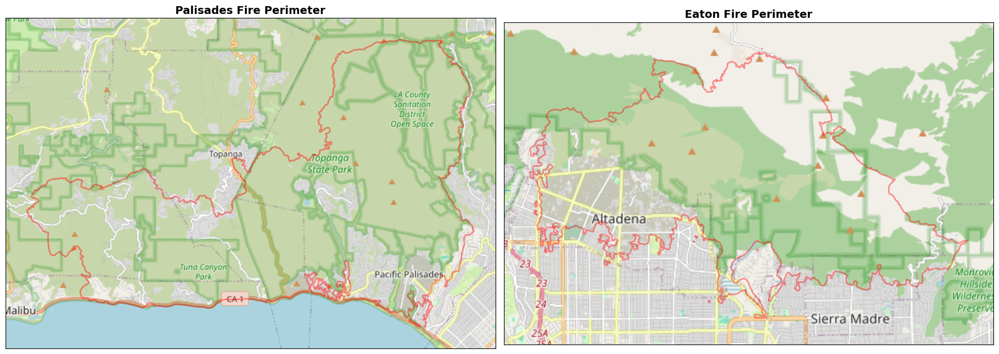

In [12]:
# MAP FIRE PERIMETERS WITH BASEMAP
fig, axes = plt.subplots(1, 2, figsize = (18, 8))

for idx, fire_name in enumerate(["Palisades", "Eaton"]):
    ax = axes[idx]
    gdf = vector_files[f"{fire_name}_perimeter"].to_crs(epsg = 3857)
    bounds = gdf.total_bounds
    ax.set_xlim(bounds[0] - 1000, bounds[2] + 1000)
    ax.set_ylim(bounds[1] - 1000, bounds[3] + 1000)
    ctx.add_basemap(ax, crs = gdf.crs, source = ctx.providers.OpenStreetMap.Mapnik, zoom = 12, attribution = False)
    gdf.plot(ax = ax, alpha = 0.4, edgecolor = "red", facecolor = "none", linewidth = 2)
    ax.set_title(f"{fire_name} Fire Perimeter", fontsize = 14, fontweight = "bold")
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)

plt.tight_layout()
plt.savefig(images_path / "fire_perimeters.png", dpi = 300, bbox_inches = "tight")
plt.show()

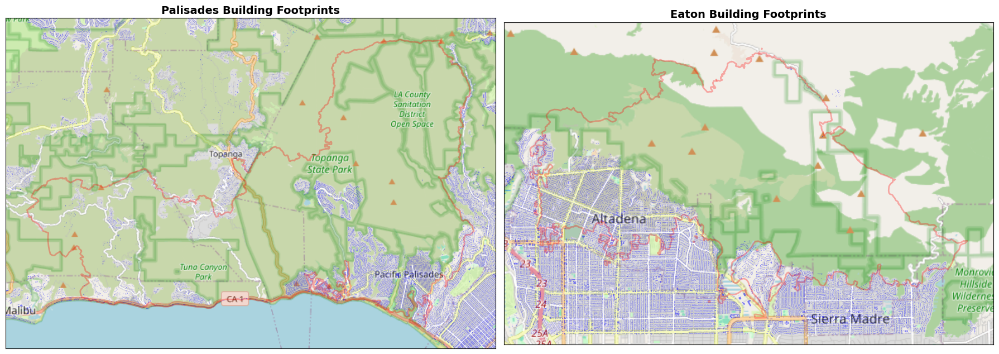

In [13]:
# MAP BUILDING FOOTPRINTS WITH BASEMAP
fig, axes = plt.subplots(1, 2, figsize = (18, 8))

for idx, fire_name in enumerate(["Palisades", "Eaton"]):
    ax = axes[idx]
    perimeter = vector_files[f"{fire_name}_perimeter"].to_crs(epsg = 3857)
    buildings = vector_files[f"{fire_name}_buildings"].to_crs(epsg = 3857)
    bounds = perimeter.total_bounds
    ax.set_xlim(bounds[0] - 1000, bounds[2] + 1000)
    ax.set_ylim(bounds[1] - 1000, bounds[3] + 1000)
    ctx.add_basemap(ax, crs = buildings.crs, source = ctx.providers.OpenStreetMap.Mapnik, zoom = 12, attribution = False)
    perimeter.plot(ax = ax, alpha = 0.3, edgecolor = "red", facecolor = "none", linewidth = 2)
    buildings.plot(ax = ax, alpha = 0.5, color = "blue", markersize = 1)
    ax.set_title(f"{fire_name} Building Footprints", fontsize = 14, fontweight = "bold")
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)

plt.tight_layout()
plt.savefig(images_path / "building_footprints.png", dpi = 300, bbox_inches = "tight")
plt.show()

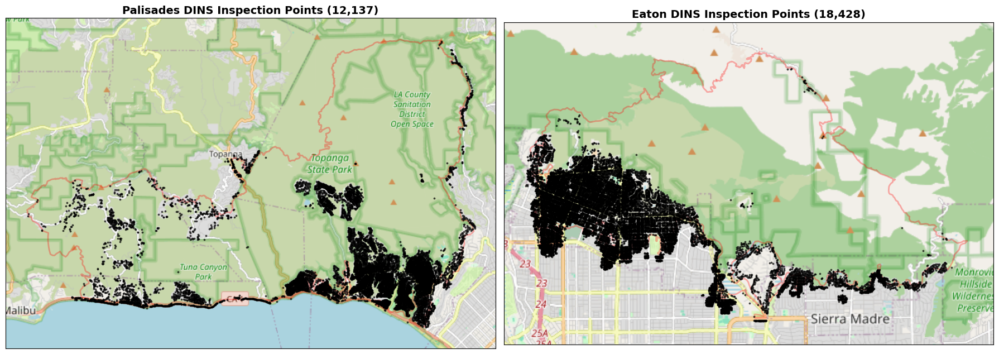

In [14]:
# MAP DINS DAMAGE POINTS WITH BASEMAP
fig, axes = plt.subplots(1, 2, figsize = (18, 8))

for idx, fire_name in enumerate(["Palisades", "Eaton"]):
    ax = axes[idx]
    perimeter = vector_files[f"{fire_name}_perimeter"].to_crs(epsg = 3857)
    dins = vector_files[f"{fire_name}_dins"].to_crs(epsg = 3857)
    bounds = perimeter.total_bounds
    ax.set_xlim(bounds[0] - 1000, bounds[2] + 1000)
    ax.set_ylim(bounds[1] - 1000, bounds[3] + 1000)
    ctx.add_basemap(ax, crs = dins.crs, source = ctx.providers.OpenStreetMap.Mapnik, zoom = 12, attribution = False)
    perimeter.plot(ax = ax, alpha = 0.3, edgecolor = "red", facecolor = "none", linewidth = 2)
    dins.plot(ax = ax, alpha = 0.6, color = "black", markersize = 3)
    ax.set_title(f"{fire_name} DINS Inspection Points ({len(dins):,})", fontsize = 14, fontweight = "bold")
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)

plt.tight_layout()
plt.savefig(images_path / "dins_damage_points.png", dpi = 300, bbox_inches = "tight")
plt.show()

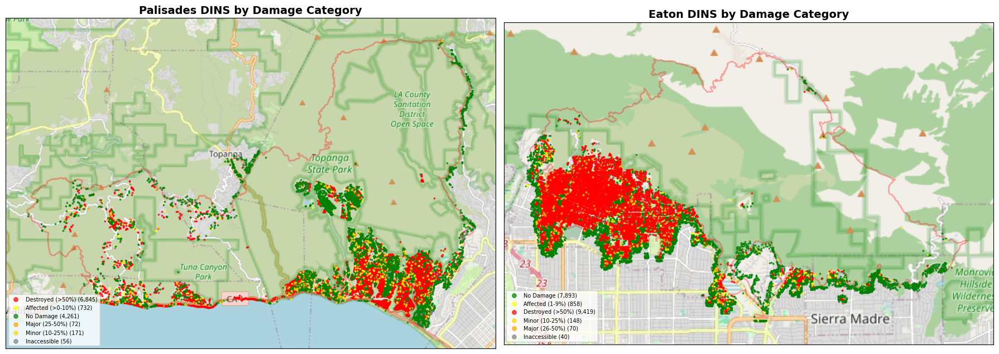

In [15]:
# MAP DINS BY DAMAGE CATEGORY
fig, axes = plt.subplots(1, 2, figsize = (18, 8))

# Color assignment based on substring matching to handle cross-fire category variants.
# Palisades uses "Major (25-50%)" while Eaton uses "Major (26-50%)", etc.
def get_damage_color(category):
    cat_lower = str(category).lower()
    if "destroyed" in cat_lower:
        return "red"
    elif "major" in cat_lower:
        return "orange"
    elif "minor" in cat_lower:
        return "gold"
    elif "affected" in cat_lower:
        return "yellow"
    elif "inaccessible" in cat_lower:
        return "gray"
    elif "no damage" in cat_lower:
        return "green"
    return "purple"


for idx, fire_name in enumerate(["Palisades", "Eaton"]):
    ax = axes[idx]
    perimeter = vector_files[f"{fire_name}_perimeter"].to_crs(epsg = 3857)
    dins = vector_files[f"{fire_name}_dins"].to_crs(epsg = 3857)
    bounds = perimeter.total_bounds
    ax.set_xlim(bounds[0] - 1000, bounds[2] + 1000)
    ax.set_ylim(bounds[1] - 1000, bounds[3] + 1000)
    ctx.add_basemap(ax, crs = dins.crs, source = ctx.providers.OpenStreetMap.Mapnik, zoom = 12, attribution = False)
    perimeter.plot(ax = ax, alpha = 0.3, edgecolor = "red", facecolor = "none", linewidth = 2)

    if "DAMAGE" in dins.columns:
        for cat in dins["DAMAGE"].unique():
            subset = dins[dins["DAMAGE"] == cat]
            color = get_damage_color(cat)
            subset.plot(ax = ax, color = color, markersize = 3, alpha = 0.7, label = f"{cat} ({len(subset):,})")
        ax.legend(loc = "lower left", fontsize = 7, markerscale = 3)

    ax.set_title(f"{fire_name} DINS by Damage Category", fontsize = 14, fontweight = "bold")
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)

plt.tight_layout()
plt.savefig(images_path / "dins_by_damage_category.png", dpi = 300, bbox_inches = "tight")
plt.show()

### Preprocessing Helper Functions

Reusable functions for STAC query, cloud masking, spectral index calculation, DEM processing, vector rasterization, and tensor stacking.

In [16]:
# STAC CATALOG CONNECTIONS
stac_catalog_url = "https://earth-search.aws.element84.com/v1"
stac_catalog = Client.open(stac_catalog_url)

dem_catalog_url = "https://planetarycomputer.microsoft.com/api/stac/v1"
dem_catalog = Client.open(dem_catalog_url, modifier = planetary_computer.sign_inplace)

In [17]:
def query_sentinel2(catalog, bbox, start_date, end_date, cloud_threshold = 30):
    """
    Query Sentinel-2 L2A imagery and return all scenes from the best date.
    Groups by acquisition date to handle bboxes that straddle tile boundaries.
    """
    search = catalog.search(
        collections = ["sentinel-2-l2a"],
        bbox = bbox,
        datetime = f"{start_date}/{end_date}",
        query = {"eo:cloud_cover": {"lt": cloud_threshold}},
    )
    items = list(search.item_collection())
    if not items:
        return [], items

    # Group scenes by acquisition date.
    from collections import defaultdict
    date_groups = defaultdict(list)
    for item in items:
        date_key = item.datetime.strftime("%Y-%m-%d")
        date_groups[date_key].append(item)

    # Select date with lowest mean cloud cover across tiles.
    best_date = min(
        date_groups.keys(),
        key = lambda d: np.mean([
            it.properties.get("eo:cloud_cover", 100) for it in date_groups[d]
        ])
    )

    best_items = date_groups[best_date]
    return best_items, items


def load_sentinel_bands(items, bbox, resolution, crs, bands = ["nir08", "swir16", "scl"]):
    """Load and mosaic specified bands from one or more STAC items into xarray."""
    data = odc.stac.load(
        items, bands = bands, bbox = bbox,
        resolution = resolution, crs = crs,
        chunks = {"x": 512, "y": 512},
        groupby = "solar_day",
    )
    return data


def apply_scl_mask(data, valid_classes = [2, 4, 5, 6, 7, 11]):
    """Apply SCL-based cloud and shadow mask to optical bands."""
    scl = data["scl"].squeeze()
    valid_mask = scl.isin(valid_classes)
    masked_nir = data["nir08"].where(valid_mask)
    masked_swir = data["swir16"].where(valid_mask)
    return masked_nir.squeeze(), masked_swir.squeeze(), valid_mask


def calc_nbr(nir, swir, epsilon = 1e-10):
    """Calculate Normalized Burn Ratio from NIR and SWIR bands."""
    nir = nir.astype(float)
    swir = swir.astype(float)
    return (nir - swir) / (nir + swir + epsilon)


def percentile_normalize(array, low_pct = 2, high_pct = 98):
    """Normalize array to [0, 1] using percentile clipping on nonzero pixels."""
    nonzero_mask = array > 0
    if np.sum(nonzero_mask) == 0:
        return array
    p_low = np.percentile(array[nonzero_mask], low_pct)
    p_high = np.percentile(array[nonzero_mask], high_pct)
    return np.clip((array - p_low) / (p_high - p_low + 1e-10), 0, 1)


def calculate_aspect(dem, cell_size):
    """Calculate compass aspect from DEM array."""
    dem_array = dem.values
    dy, dx = np.gradient(dem_array, cell_size)
    aspect_rad = np.arctan2(-dy, dx)
    aspect_deg = np.degrees(aspect_rad)
    return (90.0 - aspect_deg) % 360.0


def calculate_slope(dem, cell_size):
    """Calculate slope in degrees from DEM array."""
    dem_array = dem.values
    dy, dx = np.gradient(dem_array, cell_size)
    slope_rad = np.arctan(np.sqrt(dx**2 + dy**2))
    return np.degrees(slope_rad)


def rasterize_geometries(geometries, shape, transform, fill_value = 0, default_value = 1):
    """Rasterize vector geometries to a numpy array."""
    if len(geometries) == 0:
        return np.zeros(shape, dtype = np.uint8)
    shapes = [(geom, default_value) for geom in geometries]
    return features.rasterize(
        shapes = shapes, out_shape = shape,
        transform = transform, fill = fill_value, dtype = np.uint8,
    )

In [ ]:
def preprocess_fire(config, stac_catalog, dem_catalog,
                    pre_fire_start, pre_fire_end,
                    post_fire_start, post_fire_end,
                    target_crs, target_resolution):
    """
    Run the full preprocessing pipeline for a single fire event.
    Returns a dictionary with the feature tensor, target mask,
    AOI mask, and intermediate arrays for visualization.
    """
    name = config["name"]
    bbox = config["bbox"]

    print(f"PROCESSING {name.upper()} FIRE")

    # SENTINEL-2 IMAGERY
    print("  Querying Sentinel-2 pre-fire imagery...")
    best_pre_items, pre_items = query_sentinel2(stac_catalog, bbox, pre_fire_start, pre_fire_end)
    print("  Querying Sentinel-2 post-fire imagery...")
    best_post_items, post_items = query_sentinel2(stac_catalog, bbox, post_fire_start, post_fire_end)

    # Print all available scenes for verification.
    print(f"  Available Pre-Fire Scenes: {len(pre_items)}")
    for item in pre_items:
        cc = item.properties.get("eo:cloud_cover", "N/A")
        print(f"    {item.id} | {item.datetime.strftime('%Y-%m-%d')} | Cloud: {cc:.1f}%")
    print(f"  Selected Pre-Fire Date: {best_pre_items[0].datetime.strftime('%Y-%m-%d')} ({len(best_pre_items)} tiles)")
    for item in best_pre_items:
        print(f"    -> {item.id}")

    print(f"  Available Post-Fire Scenes: {len(post_items)}")
    for item in post_items:
        cc = item.properties.get("eo:cloud_cover", "N/A")
        print(f"    {item.id} | {item.datetime.strftime('%Y-%m-%d')} | Cloud: {cc:.1f}%")
    print(f"  Selected Post-Fire Date: {best_post_items[0].datetime.strftime('%Y-%m-%d')} ({len(best_post_items)} tiles)")
    for item in best_post_items:
        print(f"    -> {item.id}")

    # LOAD AND MOSAIC BANDS FROM ALL TILES ON BEST DATE
    pre_data = load_sentinel_bands(best_pre_items, bbox, target_resolution, target_crs)
    post_data = load_sentinel_bands(best_post_items, bbox, target_resolution, target_crs)

    # CLOUD MASKING
    pre_nir, pre_swir, pre_valid = apply_scl_mask(pre_data)
    post_nir, post_swir, post_valid = apply_scl_mask(post_data)
    print(f"  Pre-Fire Valid: {float(pre_valid.mean()) * 100:.1f}% | Post-Fire Valid: {float(post_valid.mean()) * 100:.1f}%")

    # NBR AND DNBR
    nbr_pre = calc_nbr(pre_nir, pre_swir)
    nbr_post = calc_nbr(post_nir, post_swir)
    dnbr = nbr_pre - nbr_post
    combined_valid = pre_valid & post_valid
    dnbr_masked = dnbr.where(combined_valid)

    # SPATIAL REFERENCE
    sentinel_shape = (post_data.sizes["y"], post_data.sizes["x"])
    sentinel_bounds = post_data.rio.bounds()
    raster_transform = from_bounds(
        sentinel_bounds[0], sentinel_bounds[1],
        sentinel_bounds[2], sentinel_bounds[3],
        sentinel_shape[1], sentinel_shape[0],
    )
    print(f"  Raster Shape: {sentinel_shape}")

    # DEM AND ASPECT
    print("  Loading DEM...")
    dem_search = dem_catalog.search(collections = ["3dep-seamless"], bbox = bbox)
    dem_items = list(dem_search.item_collection())
    dem_data = odc.stac.load(
        dem_items, bands = ["data"], bbox = bbox,
        resolution = target_resolution, crs = target_crs,
        chunks = {"x": 512, "y": 512},
    )
    elevation_raw = dem_data["data"].max(dim = "time").squeeze()
    elevation_raw = elevation_raw.rio.write_crs(target_crs)
    post_spatial = post_data.squeeze()
    elevation_aligned = elevation_raw.rio.reproject_match(post_spatial)
    aspect_array = calculate_aspect(elevation_aligned, target_resolution)
    aspect_normalized = aspect_array / 360.0
    slope_array = calculate_slope(elevation_aligned, target_resolution)

    # VECTOR DATA
    print("  Rasterizing vectors...")
    bbox_geometry = box(bbox[0], bbox[1], bbox[2], bbox[3])
    fire_perimeter_gdf = gpd.read_file(config["perimeter_path"])
    fire_perimeter_proj = fire_perimeter_gdf.to_crs(target_crs)
    transformer = Transformer.from_crs("EPSG:4326", target_crs, always_xy = True)
    bbox_min_x, bbox_min_y = transformer.transform(bbox[0], bbox[1])
    bbox_max_x, bbox_max_y = transformer.transform(bbox[2], bbox[3])
    bbox_proj = box(bbox_min_x, bbox_min_y, bbox_max_x, bbox_max_y)
    fire_perimeter_clipped = fire_perimeter_proj.clip(bbox_proj)

    buildings_gdf = gpd.read_file(config["buildings_path"], bbox = bbox_geometry, engine = "pyogrio")
    buildings_proj = buildings_gdf.to_crs(target_crs)

    dins_gdf = gpd.read_file(config["dins_path"], bbox = bbox_geometry)
    # Filter to all structures with any damage by excluding "No Damage".
    if "DAMAGE" in dins_gdf.columns:
        dins_damaged = dins_gdf[dins_gdf["DAMAGE"] != "No Damage"].copy()
    else:
        dins_damaged = dins_gdf.copy()
    dins_proj = dins_damaged.to_crs(target_crs)
    print(f"  DINS Damaged Structures: {len(dins_proj)}")

    # RASTERIZATION
    aoi_mask = rasterize_geometries(fire_perimeter_clipped.geometry, sentinel_shape, raster_transform)
    building_raster = rasterize_geometries(buildings_proj.geometry, sentinel_shape, raster_transform)
    dins_buffered = dins_proj.copy()
    dins_buffered.geometry = dins_buffered.geometry.buffer(15)
    dins_buffered_dissolved = dins_buffered.dissolve()
    damaged_raster = rasterize_geometries(dins_buffered_dissolved.geometry, sentinel_shape, raster_transform)

    # DINS-ONLY TARGET
    y_target = damaged_raster.copy()

    # FEATURE-LABEL INDEPENDENCE CHECK
    label_and_building = np.sum((damaged_raster == 1) & (building_raster == 1))
    label_total = np.sum(damaged_raster == 1)
    overlap_pct = (label_and_building / label_total) * 100 if label_total > 0 else 0
    correlation = np.corrcoef(building_raster.flatten(), damaged_raster.flatten())[0, 1]
    print(f"  Feature-Label Correlation: {correlation:.4f}")
    print(f"  Damage-Building Overlap: {overlap_pct:.1f}%")

    # PREPARE CHANNELS
    dnbr_array = dnbr_masked.values
    channel_dnbr = np.nan_to_num(dnbr_array.copy(), nan = 0.0)
    channel_aspect = np.nan_to_num(aspect_normalized.copy(), nan = 0.0)
    channel_buildings = building_raster.astype(float)
    channel_pre_nir = percentile_normalize(np.nan_to_num(pre_nir.values.copy(), nan = 0.0))
    channel_pre_swir = percentile_normalize(np.nan_to_num(pre_swir.values.copy(), nan = 0.0))
    channel_post_nir = percentile_normalize(np.nan_to_num(post_nir.values.copy(), nan = 0.0))
    channel_post_swir = percentile_normalize(np.nan_to_num(post_swir.values.copy(), nan = 0.0))

    # STACK TENSOR (REMOVED SLOPE)
    X_tensor = np.stack([
        channel_dnbr, channel_aspect, channel_buildings,
        channel_pre_nir, channel_pre_swir, channel_post_nir, channel_post_swir,
    ], axis = -1)

    print(f"  X_tensor: {X_tensor.shape} | y_target: {y_target.shape}")
    print(f"  Damaged Pixels: {np.sum(y_target == 1):,} | AOI Pixels: {np.sum(aoi_mask == 1):,}")
    print(f"  Imbalance: {np.sum(y_target == 0) / max(np.sum(y_target == 1), 1):.1f}:1")

    return {
        "name": name,
        "X_tensor": X_tensor,
        "y_target": y_target,
        "aoi_mask": aoi_mask,
        "sentinel_shape": sentinel_shape,
        "nbr_pre": nbr_pre.values,
        "nbr_post": nbr_post.values,
        "dnbr": dnbr_array,
        "aspect_degrees": aspect_array,
        "slope_degrees": slope_array,
        "building_raster": building_raster,
        "damaged_raster": damaged_raster,
    }


### Process Both Fires

In [19]:
# PROCESS EACH FIRE
fire_data = {}
for config in fire_configs:
    result = preprocess_fire(
        config, stac_catalog, dem_catalog,
        pre_fire_start, pre_fire_end,
        post_fire_start, post_fire_end,
        target_crs, target_resolution,
    )
    fire_data[result["name"]] = result
    print()

PROCESSING PALISADES FIRE
  Querying Sentinel-2 pre-fire imagery...
  Querying Sentinel-2 post-fire imagery...
  Available Pre-Fire Scenes: 3
    S2A_11SLT_20250102_0_L2A | 2025-01-02 | Cloud: 3.0%
    S2B_11SLT_20241218_0_L2A | 2024-12-18 | Cloud: 0.0%
    S2A_11SLT_20241213_0_L2A | 2024-12-13 | Cloud: 21.5%
  Selected Pre-Fire Date: 2024-12-18 (1 tiles)
    -> S2B_11SLT_20241218_0_L2A
  Available Post-Fire Scenes: 2
    S2C_11SLT_20250221_0_L2A | 2025-02-21 | Cloud: 5.0%
    S2C_11SLT_20250201_0_L2A | 2025-02-01 | Cloud: 15.8%
  Selected Post-Fire Date: 2025-02-21 (1 tiles)
    -> S2C_11SLT_20250221_0_L2A
  Pre-Fire Valid: 100.0% | Post-Fire Valid: 96.0%
  Raster Shape: (801, 1173)
  Loading DEM...
  Rasterizing vectors...
  DINS Damaged Structures: 7876
  Feature-Label Correlation: 0.1907
  Damage-Building Overlap: 38.3%
  X_tensor: (801, 1173, 7) | y_target: (801, 1173)
  Damaged Pixels: 10,111 | AOI Pixels: 243,261
  Imbalance: 91.9:1

PROCESSING EATON FIRE
  Querying Sentinel-2 p

### Preprocessing Visualizations

Visual verification of all intermediate raster layers produced by the preprocessing pipeline.

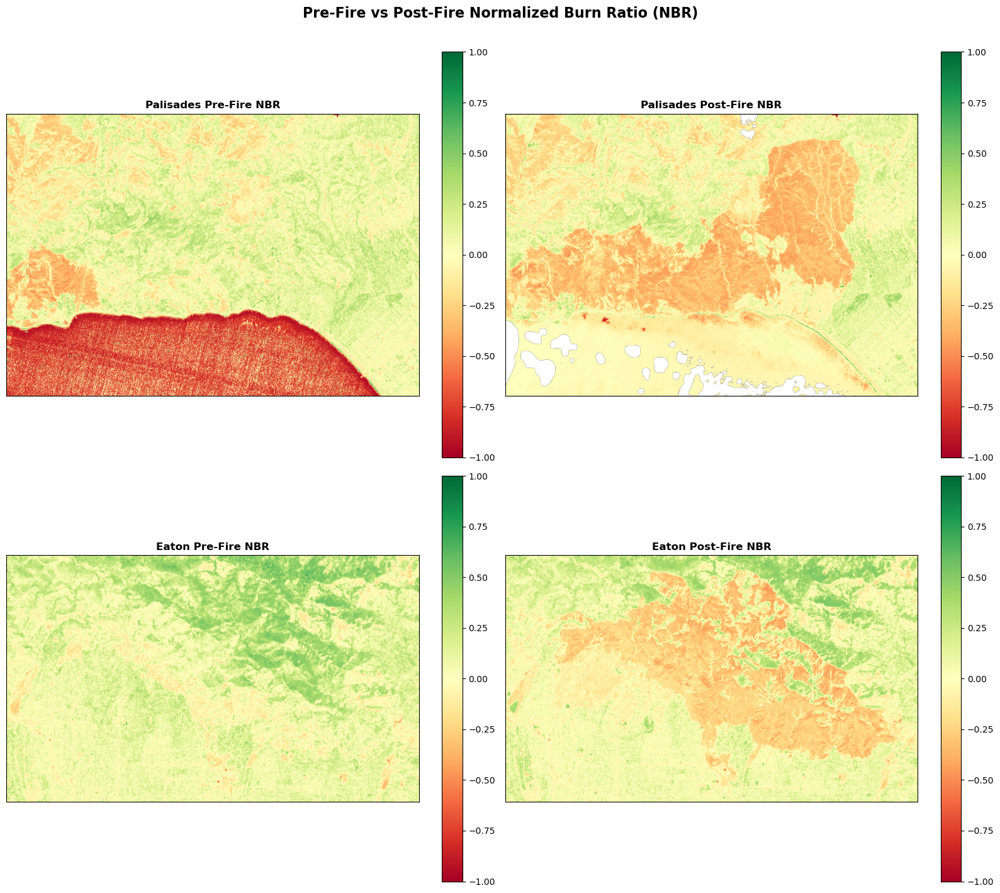

In [20]:
# NBR COMPARISON: PRE-FIRE VS POST-FIRE
fig, axes = plt.subplots(2, 2, figsize = (16, 14))

for idx, fire_name in enumerate(["Palisades", "Eaton"]):
    data = fire_data[fire_name]
    im0 = axes[idx, 0].imshow(data["nbr_pre"], cmap = "RdYlGn", vmin = -1, vmax = 1)
    axes[idx, 0].set_title(f"{fire_name} Pre-Fire NBR", fontweight = "bold")
    axes[idx, 0].xaxis.set_visible(False)
    axes[idx, 0].yaxis.set_visible(False)
    plt.colorbar(im0, ax = axes[idx, 0], fraction = 0.05)

    im1 = axes[idx, 1].imshow(data["nbr_post"], cmap = "RdYlGn", vmin = -1, vmax = 1)
    axes[idx, 1].set_title(f"{fire_name} Post-Fire NBR", fontweight = "bold")
    axes[idx, 1].xaxis.set_visible(False)
    axes[idx, 1].yaxis.set_visible(False)
    plt.colorbar(im1, ax = axes[idx, 1], fraction = 0.05)

plt.suptitle("Pre-Fire vs Post-Fire Normalized Burn Ratio (NBR)", fontsize = 16, fontweight = "bold", y = 1.01)
plt.tight_layout()
plt.savefig(images_path / "nbr_pre_vs_post.png", dpi = 300, bbox_inches = "tight")
plt.show()

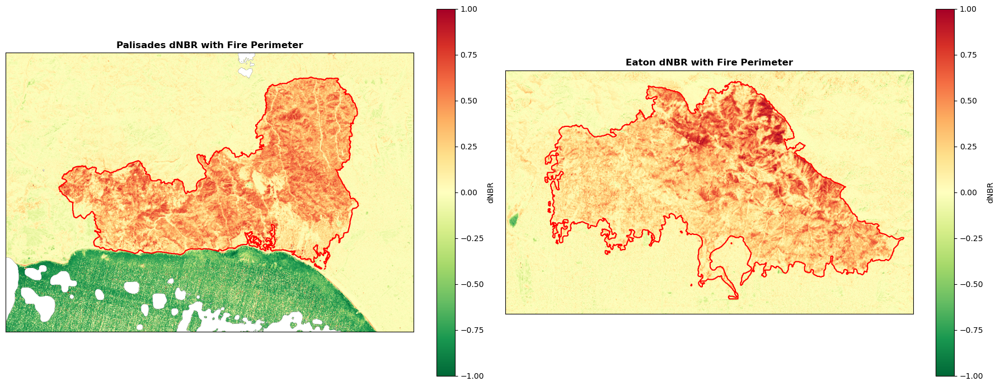

In [21]:
# DNBR WITH AOI OVERLAY
fig, axes = plt.subplots(1, 2, figsize = (18, 7))

for idx, fire_name in enumerate(["Palisades", "Eaton"]):
    data = fire_data[fire_name]
    im = axes[idx].imshow(data["dnbr"], cmap = "RdYlGn_r", vmin = -1, vmax = 1)
    axes[idx].contour(data["aoi_mask"], levels = [0.5], colors = "red", linewidths = 1.5)
    axes[idx].set_title(f"{fire_name} dNBR with Fire Perimeter", fontweight = "bold")
    axes[idx].xaxis.set_visible(False)
    axes[idx].yaxis.set_visible(False)
    plt.colorbar(im, ax = axes[idx], fraction = 0.05, label = "dNBR")

plt.tight_layout()
plt.savefig(images_path / "dnbr_with_aoi.png", dpi = 300, bbox_inches = "tight")
plt.show()

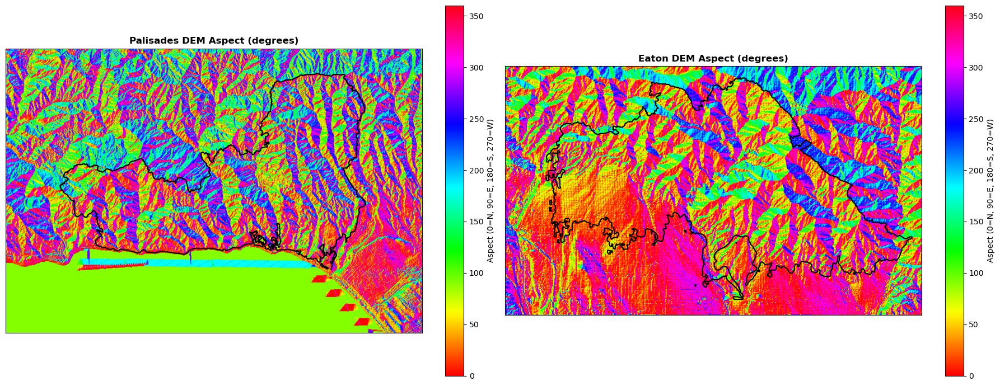

In [22]:
# DEM ASPECT
fig, axes = plt.subplots(1, 2, figsize = (18, 7))

for idx, fire_name in enumerate(["Palisades", "Eaton"]):
    data = fire_data[fire_name]
    im = axes[idx].imshow(data["aspect_degrees"], cmap = "hsv", vmin = 0, vmax = 360)
    axes[idx].contour(data["aoi_mask"], levels = [0.5], colors = "black", linewidths = 1.5)
    axes[idx].set_title(f"{fire_name} DEM Aspect (degrees)", fontweight = "bold")
    axes[idx].xaxis.set_visible(False)
    axes[idx].yaxis.set_visible(False)
    plt.colorbar(im, ax = axes[idx], fraction = 0.05, label = "Aspect (0=N, 90=E, 180=S, 270=W)")

plt.tight_layout()
plt.savefig(images_path / "dem_aspect.png", dpi = 300, bbox_inches = "tight")
plt.show()

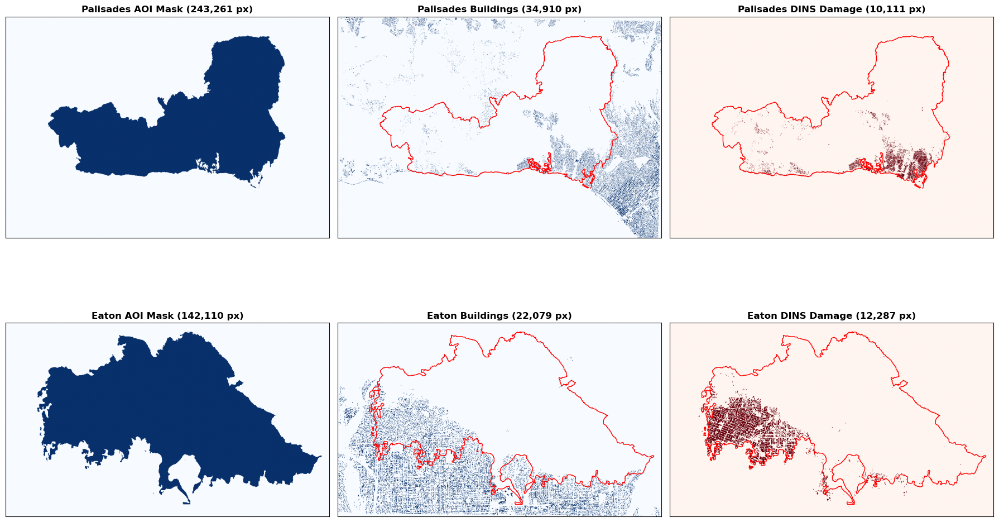

In [23]:
# RASTERIZED LAYERS: AOI, BUILDINGS, DINS DAMAGE
fig, axes = plt.subplots(2, 3, figsize = (18, 12))

for idx, fire_name in enumerate(["Palisades", "Eaton"]):
    data = fire_data[fire_name]

    axes[idx, 0].imshow(data["aoi_mask"], cmap = "Blues")
    axes[idx, 0].set_title(f"{fire_name} AOI Mask ({np.sum(data['aoi_mask']):,} px)", fontweight = "bold")

    axes[idx, 1].imshow(data["building_raster"], cmap = "Blues")
    axes[idx, 1].contour(data["aoi_mask"], levels = [0.5], colors = "red", linewidths = 1)
    axes[idx, 1].set_title(f"{fire_name} Buildings ({np.sum(data['building_raster']):,} px)", fontweight = "bold")

    axes[idx, 2].imshow(data["damaged_raster"], cmap = "Reds")
    axes[idx, 2].contour(data["aoi_mask"], levels = [0.5], colors = "red", linewidths = 1)
    axes[idx, 2].set_title(f"{fire_name} DINS Damage ({np.sum(data['damaged_raster']):,} px)", fontweight = "bold")

    for j in range(3):
        axes[idx, j].xaxis.set_visible(False)
        axes[idx, j].yaxis.set_visible(False)

plt.tight_layout()
plt.savefig(images_path / "rasterized_layers.png", dpi = 300, bbox_inches = "tight")
plt.show()

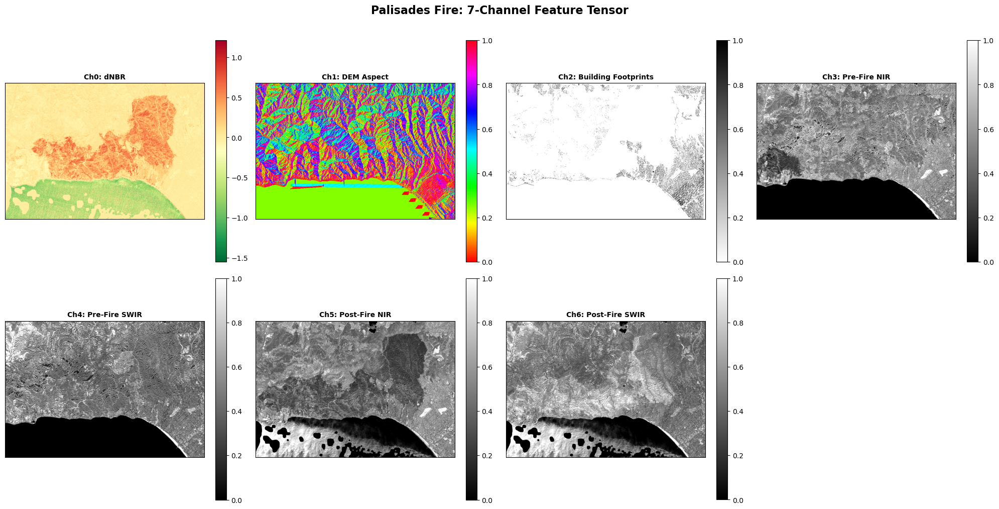

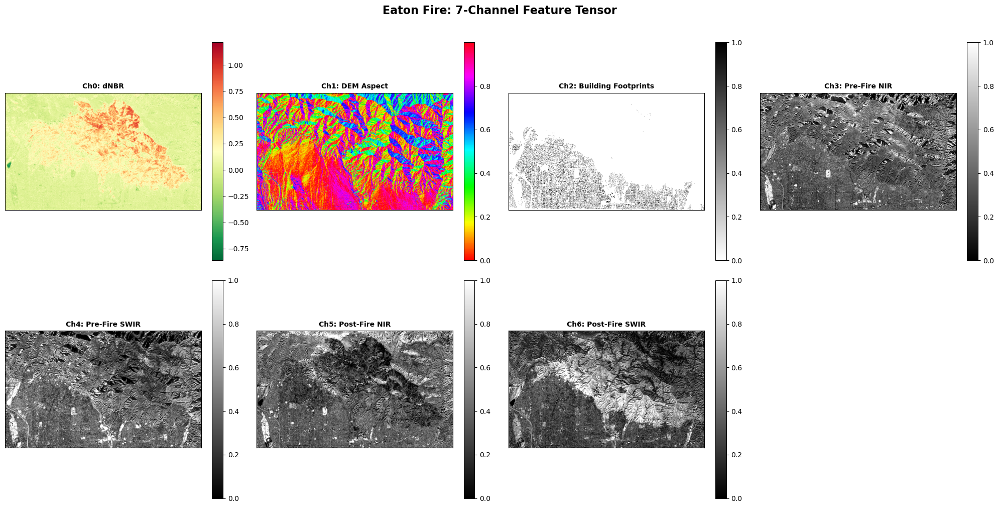

In [24]:
# ALL 7 TENSOR CHANNELS FOR EACH FIRE
channel_names_vis = [
    "dNBR", "DEM Aspect", "Building Footprints",
    "Pre-Fire NIR", "Pre-Fire SWIR", "Post-Fire NIR", "Post-Fire SWIR",
]
channel_cmaps = ["RdYlGn_r", "hsv", "binary", "gray", "gray", "gray", "gray"]

for fire_name in ["Palisades", "Eaton"]:
    data = fire_data[fire_name]
    fig, axes = plt.subplots(2, 4, figsize = (20, 10))
    axes = axes.flatten()

    for ch_idx in range(7):
        ch_data = data["X_tensor"][:, :, ch_idx]
        im = axes[ch_idx].imshow(ch_data, cmap = channel_cmaps[ch_idx])
        axes[ch_idx].set_title(f"Ch{ch_idx}: {channel_names_vis[ch_idx]}", fontweight = "bold", fontsize = 10)
        axes[ch_idx].xaxis.set_visible(False)
        axes[ch_idx].yaxis.set_visible(False)
        plt.colorbar(im, ax = axes[ch_idx], fraction = 0.05)

    axes[7].axis('off') # Hide the empty 8th subplot.

    plt.suptitle(f"{fire_name} Fire: 7-Channel Feature Tensor", fontsize = 16, fontweight = "bold", y = 1.01)
    plt.tight_layout()
    plt.savefig(images_path / f"tensor_channels_{fire_name.lower()}.png", dpi = 300, bbox_inches = "tight")
    plt.show()


### Combined Dataset Statistics

In [25]:
# COMBINED DATASET STATISTICS
total_damaged = sum(np.sum(d["y_target"] == 1) for d in fire_data.values())
total_aoi = sum(np.sum(d["aoi_mask"] == 1) for d in fire_data.values())
channels = list(fire_data.values())[0]["X_tensor"].shape[2]

print("COMBINED DATASET")
for name, data in fire_data.items():
    d = np.sum(data["y_target"] == 1)
    a = np.sum(data["aoi_mask"] == 1)
    print(f"  {name}: {data['X_tensor'].shape} | Damaged: {d:,} | AOI: {a:,} | Damage %: {d/a*100:.2f}%")

print(f"\nTotal Damaged Pixels: {total_damaged:,}")
print(f"Total AOI Pixels: {total_aoi:,}")
print(f"Combined Damage % of AOI: {total_damaged / total_aoi * 100:.2f}%")
print(f"Combined Imbalance Ratio: {(total_aoi - total_damaged) / max(total_damaged, 1):.1f}:1")
print(f"Feature Channels: {channels}")

COMBINED DATASET
  Palisades: (801, 1173, 7) | Damaged: 10,111 | AOI: 243,261 | Damage %: 4.16%
  Eaton: (465, 778, 7) | Damaged: 12,287 | AOI: 142,110 | Damage %: 8.65%

Total Damaged Pixels: 22,398
Total AOI Pixels: 385,371
Combined Damage % of AOI: 5.81%
Combined Imbalance Ratio: 16.2:1
Feature Channels: 7


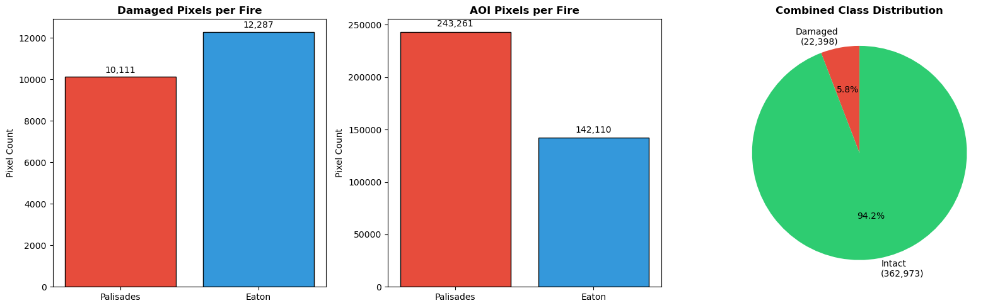

In [26]:
# CLASS DISTRIBUTION BAR CHART
fig, axes = plt.subplots(1, 3, figsize = (16, 5))

fire_names = list(fire_data.keys())
damaged_counts = [np.sum(fire_data[n]["y_target"] == 1) for n in fire_names]
intact_counts = [np.sum(fire_data[n]["aoi_mask"] == 1) - np.sum(fire_data[n]["y_target"] == 1) for n in fire_names]

# Per-fire damage pixel counts.
axes[0].bar(fire_names, damaged_counts, color = ["#E74C3C", "#3498DB"], edgecolor = "black")
for i, v in enumerate(damaged_counts):
    axes[0].text(i, v + 200, f"{v:,}", ha = "center", fontsize = 10)
axes[0].set_ylabel("Pixel Count")
axes[0].set_title("Damaged Pixels per Fire", fontweight = "bold")

# Per-fire AOI pixel counts.
aoi_counts = [np.sum(fire_data[n]["aoi_mask"] == 1) for n in fire_names]
axes[1].bar(fire_names, aoi_counts, color = ["#E74C3C", "#3498DB"], edgecolor = "black")
for i, v in enumerate(aoi_counts):
    axes[1].text(i, v + 5000, f"{v:,}", ha = "center", fontsize = 10)
axes[1].set_ylabel("Pixel Count")
axes[1].set_title("AOI Pixels per Fire", fontweight = "bold")

# Combined class distribution pie.
axes[2].pie([total_damaged, total_aoi - total_damaged],
            labels = [f"Damaged\n({total_damaged:,})", f"Intact\n({total_aoi - total_damaged:,})"],
            colors = ["#E74C3C", "#2ECC71"], autopct = "%.1f%%", startangle = 90,
            textprops = {"fontsize": 10})
axes[2].set_title("Combined Class Distribution", fontweight = "bold")

plt.tight_layout()
plt.savefig(images_path / "class_distribution.png", dpi = 300, bbox_inches = "tight")
plt.show()

### Save Preprocessed Data

Save per-fire feature tensors, DINS-only ground truth labels, AOI masks, and metadata to `eaton_test_files/model/` for the modeling notebook.

In [27]:
# SAVE PREPROCESSED ARRAYS AND METADATA
channel_names = [
    "dNBR", "DEM Aspect", "Building Footprints",
    "Pre-Fire NIR", "Pre-Fire SWIR", "Post-Fire NIR", "Post-Fire SWIR",
]

fire_metadata = {
    "fires": [],
    "channel_names": channel_names,
    "n_channels": len(channel_names),
    "target_crs": target_crs,
    "target_resolution": target_resolution,
    "pre_fire_window": f"{pre_fire_start} to {pre_fire_end}",
    "post_fire_window": f"{post_fire_start} to {post_fire_end}",
    "random_seed": int(random_seed),
}

for fire_name, data in fire_data.items():
    suffix = fire_name.lower()

    # Save feature tensor.
    x_path = model_path / f"X_tensor_{suffix}.npy"
    np.save(x_path, data["X_tensor"])

    # Save DINS-only ground truth labels.
    y_path = model_path / f"y_target_{suffix}.npy"
    np.save(y_path, data["y_target"])

    # Save fire perimeter binary mask.
    aoi_path = model_path / f"aoi_mask_{suffix}.npy"
    np.save(aoi_path, data["aoi_mask"])

    fire_entry = {
        "name": fire_name,
        "X_tensor_file": f"X_tensor_{suffix}.npy",
        "y_target_file": f"y_target_{suffix}.npy",
        "aoi_mask_file": f"aoi_mask_{suffix}.npy",
        "X_shape": list(data["X_tensor"].shape),
        "y_shape": list(data["y_target"].shape),
        "damaged_pixels": int(np.sum(data["y_target"] == 1)),
        "aoi_pixels": int(np.sum(data["aoi_mask"] == 1)),
    }
    fire_metadata["fires"].append(fire_entry)

    print(f"{fire_name}: saved X{data['X_tensor'].shape}, y{data['y_target'].shape}, aoi{data['aoi_mask'].shape}")

# Save metadata JSON for reproducibility.
metadata_path = model_path / "preprocessing_metadata.json"
with open(metadata_path, "w") as f:
    json.dump(fire_metadata, f, indent = 2)

print(f"\nMetadata saved to {metadata_path}")
print(f"Total files saved: {len(fire_metadata['fires']) * 3 + 1}")

Palisades: saved X(801, 1173, 7), y(801, 1173), aoi(801, 1173)
Eaton: saved X(465, 778, 7), y(465, 778), aoi(465, 778)

Metadata saved to eaton_test_files\model\preprocessing_metadata.json
Total files saved: 7
